In [22]:
import os
import sys
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import manifold
from sklearn import decomposition
from matplotlib.backends.backend_pdf import PdfPages
import importlib

sys.path.append('../catrace/')
import catrace
from catrace import dataio
import catrace.process_time_trace as ptt
import catrace.plot_trace as pltr
import catrace.pattern_correlation as pcr
import catrace.manifold_embed as emb
import catrace.exp_collection as ecl
from catrace.frame_time import convert_sec_to_frame
from catrace.trace_dataframe import concatenate_planes
importlib.reload(catrace.plot_trace)
importlib.reload(ecl)
importlib.reload(pcr)


<module 'catrace.pattern_correlation' from '/home/hubo/Projects/Ca_imaging/scripts/cca/../catrace/catrace/pattern_correlation.py'>

In [23]:
importlib.reload(ecl)
exp_list = [( '2021-02-05-DpOBEM-JH9','phe'),
            ('2021-03-18-DpOBEM-JH10','phe'),
            ('2021-03-19-DpOBEM-JH10','phe'),
            ('2021-04-02-DpOBEM-JH11','phe'),
            ('2021-04-03-DpOBEM-JH11','phe'),
            ('2021-05-01-DpOBEM-JH13','phe'),
            ('2021-05-22-DpOBEM-JH14','phe'),
            ('2021-07-15-DpOBEM-N2'  ,'naive'),
            ('2021-07-16-DpOBEM-N3' ,'naive'),
            ('2021-07-30-DpOBEM-JH17','arg'),
            ('2021-07-31-DpOBEM-JH17','arg'),
            ('2021-09-02-DpOBEM-JH18','arg'),
            ('2021-09-03-DpOBEM-JH18','arg'),
            ('2021-09-04-DpOBEM-JH18','arg'),
            ('2021-09-15-DpOBEM-JH20','phe'),
            ('2021-09-17-DpOBEM-JH20','phe'),
            ('2021-09-18-DpOBEM-JH20','phe'),
            ('2021-09-29-DpOBEM-JH21','arg'),
            ('2021-10-01-DpOBEM-JH21','arg'),
            ('2021-10-02-DpOBEM-JH21','arg'),
            ('2021-11-10-DpOBEM-JH23','phetrp'),
            ('2021-11-14-DpOBEM-JH23','phetrp'),
            ('2021-11-24-DpOBEM-JH24','phetrp'),
            ('2021-11-27-DpOBEM-JH24','phetrp'),
            ('2021-11-26-DpOBEM-JH24','phetrp'),
            ('2021-12-10-DpOBEM-N4','naive')]
region_list = ['Dp', 'OB']
frame_rate = 30/4
#num_trial = 3
exp_info = dict(num_trial=3)
odor_list = ['phe', 'trp', 'arg', 'tdca', 'tca', 'gca', 'acsf', 'spont']
#plane_nb_list = np.array([1,2,3,4]) - 1

In [24]:
data_root_dir = '/media/hubo/WD_BoHu/Ca_imaging/results/'
dfovf_dict = dict()
for region in region_list:
    dfovf_dict[region] = dict()
    for exp in exp_list:
        exp_name = exp[0]
        print(exp_name, region)
        dfovf_dict[region][exp_name] = ecl.load_dfovf(data_root_dir,
                                                  exp_name, region)

2021-02-05-DpOBEM-JH9 Dp
2021-03-18-DpOBEM-JH10 Dp
2021-03-19-DpOBEM-JH10 Dp
2021-04-02-DpOBEM-JH11 Dp
2021-04-03-DpOBEM-JH11 Dp
2021-05-01-DpOBEM-JH13 Dp
2021-05-22-DpOBEM-JH14 Dp
2021-07-15-DpOBEM-N2 Dp
2021-07-16-DpOBEM-N3 Dp
2021-07-30-DpOBEM-JH17 Dp
2021-07-31-DpOBEM-JH17 Dp
2021-09-02-DpOBEM-JH18 Dp
2021-09-03-DpOBEM-JH18 Dp
2021-09-04-DpOBEM-JH18 Dp
2021-09-15-DpOBEM-JH20 Dp
2021-09-17-DpOBEM-JH20 Dp
2021-09-18-DpOBEM-JH20 Dp
2021-09-29-DpOBEM-JH21 Dp
2021-10-01-DpOBEM-JH21 Dp
2021-10-02-DpOBEM-JH21 Dp
2021-11-10-DpOBEM-JH23 Dp
2021-11-14-DpOBEM-JH23 Dp
2021-11-24-DpOBEM-JH24 Dp
2021-11-27-DpOBEM-JH24 Dp
2021-11-26-DpOBEM-JH24 Dp
2021-12-10-DpOBEM-N4 Dp
2021-02-05-DpOBEM-JH9 OB
2021-03-18-DpOBEM-JH10 OB
2021-03-19-DpOBEM-JH10 OB
2021-04-02-DpOBEM-JH11 OB
2021-04-03-DpOBEM-JH11 OB
2021-05-01-DpOBEM-JH13 OB
2021-05-22-DpOBEM-JH14 OB
2021-07-15-DpOBEM-N2 OB
2021-07-16-DpOBEM-N3 OB
2021-07-30-DpOBEM-JH17 OB
2021-07-31-DpOBEM-JH17 OB
2021-09-02-DpOBEM-JH18 OB
2021-09-03-DpOBEM-JH18 O

In [25]:
csplus_dict = dict()
for exp in exp_list:
    if exp[1] not in csplus_dict.keys():
        csplus_dict[exp[1]] = []
    csplus_dict[exp[1]].append(exp[0])
csplus_dict

{'phe': ['2021-02-05-DpOBEM-JH9',
  '2021-03-18-DpOBEM-JH10',
  '2021-03-19-DpOBEM-JH10',
  '2021-04-02-DpOBEM-JH11',
  '2021-04-03-DpOBEM-JH11',
  '2021-05-01-DpOBEM-JH13',
  '2021-05-22-DpOBEM-JH14',
  '2021-09-15-DpOBEM-JH20',
  '2021-09-17-DpOBEM-JH20',
  '2021-09-18-DpOBEM-JH20'],
 'naive': ['2021-07-15-DpOBEM-N2',
  '2021-07-16-DpOBEM-N3',
  '2021-12-10-DpOBEM-N4'],
 'arg': ['2021-07-30-DpOBEM-JH17',
  '2021-07-31-DpOBEM-JH17',
  '2021-09-02-DpOBEM-JH18',
  '2021-09-03-DpOBEM-JH18',
  '2021-09-04-DpOBEM-JH18',
  '2021-09-29-DpOBEM-JH21',
  '2021-10-01-DpOBEM-JH21',
  '2021-10-02-DpOBEM-JH21'],
 'phetrp': ['2021-11-10-DpOBEM-JH23',
  '2021-11-14-DpOBEM-JH23',
  '2021-11-24-DpOBEM-JH24',
  '2021-11-27-DpOBEM-JH24',
  '2021-11-26-DpOBEM-JH24']}

In [26]:
importlib.reload(ecl)
select_neuron_explist = ecl.get_data_dict_decorator(exp_list, region_list, dfovf_dict, ptt.select_neuron)
thresh = 5.5
dfovf_select_dict = select_neuron_explist(thresh)

2021-02-05-DpOBEM-JH9 Dp
2021-03-18-DpOBEM-JH10 Dp
2021-03-19-DpOBEM-JH10 Dp
2021-04-02-DpOBEM-JH11 Dp
2021-04-03-DpOBEM-JH11 Dp
2021-05-01-DpOBEM-JH13 Dp
2021-05-22-DpOBEM-JH14 Dp
2021-07-15-DpOBEM-N2 Dp
2021-07-16-DpOBEM-N3 Dp
2021-07-30-DpOBEM-JH17 Dp
2021-07-31-DpOBEM-JH17 Dp
2021-09-02-DpOBEM-JH18 Dp
2021-09-03-DpOBEM-JH18 Dp
2021-09-04-DpOBEM-JH18 Dp
2021-09-15-DpOBEM-JH20 Dp
2021-09-17-DpOBEM-JH20 Dp
2021-09-18-DpOBEM-JH20 Dp
2021-09-29-DpOBEM-JH21 Dp
2021-10-01-DpOBEM-JH21 Dp
2021-10-02-DpOBEM-JH21 Dp
2021-11-10-DpOBEM-JH23 Dp
2021-11-14-DpOBEM-JH23 Dp
2021-11-24-DpOBEM-JH24 Dp
2021-11-27-DpOBEM-JH24 Dp
2021-11-26-DpOBEM-JH24 Dp
2021-12-10-DpOBEM-N4 Dp
2021-02-05-DpOBEM-JH9 OB
2021-03-18-DpOBEM-JH10 OB
2021-03-19-DpOBEM-JH10 OB
2021-04-02-DpOBEM-JH11 OB
2021-04-03-DpOBEM-JH11 OB
2021-05-01-DpOBEM-JH13 OB
2021-05-22-DpOBEM-JH14 OB
2021-07-15-DpOBEM-N2 OB
2021-07-16-DpOBEM-N3 OB
2021-07-30-DpOBEM-JH17 OB
2021-07-31-DpOBEM-JH17 OB
2021-09-02-DpOBEM-JH18 OB
2021-09-03-DpOBEM-JH18 O

/home/hubo/Projects/Ca_imaging/scripts/cca/../catrace/catrace/exp_collection.py:18: FutureWarning: Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.median(level=1) should use df.groupby(level=1).median().
  pat = dfrestack.mean(level=[0, 1])
/home/hubo/.local/lib/python3.8/site-packages/pandas/core/generic.py:4150: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


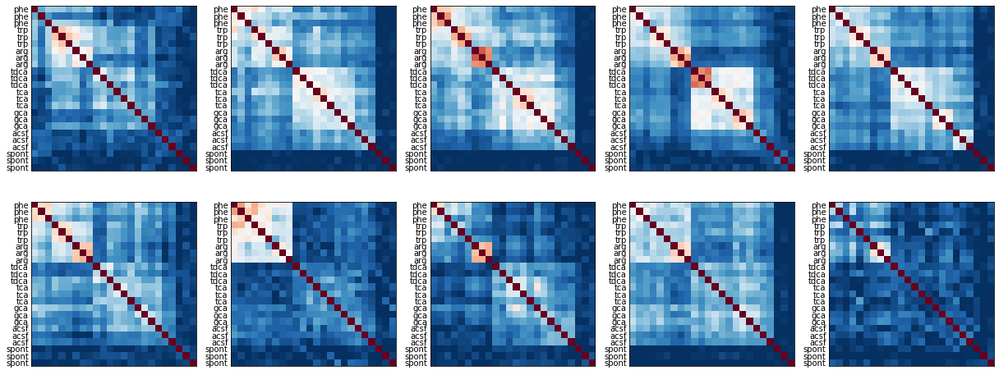

In [27]:
importlib.reload(ecl)
plot_explist_pattern_corr = ecl.plot_explist_decorator(ecl.plot_exp_pattern_correlation,csplus_dict,dfovf_dict,
                                                   sharey=False)
dp_time_window = [6,7]
csplus = 'phe'
region = 'Dp'
fig = plot_explist_pattern_corr(csplus, region, odor_list, frame_rate, time_window=dp_time_window)

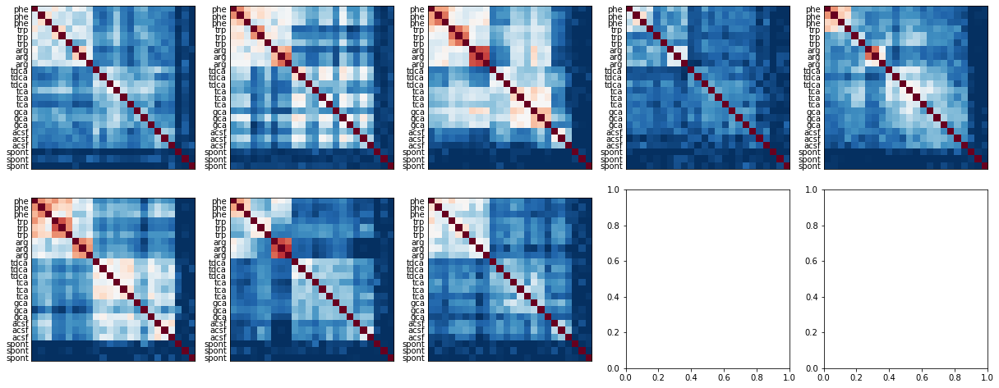

In [28]:
csplus = 'arg'
region = 'Dp'
fig = plot_explist_pattern_corr(csplus, region, odor_list, frame_rate, time_window=dp_time_window)

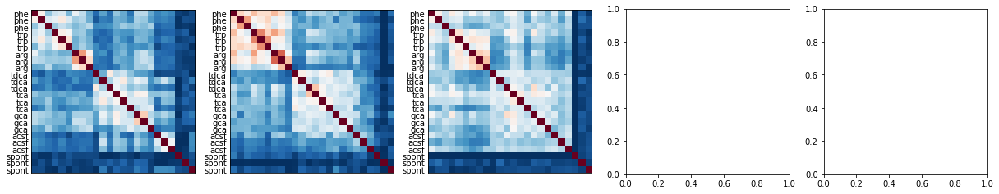

In [29]:
csplus = 'naive'
region = 'Dp'
fig = plot_explist_pattern_corr(csplus, region, odor_list, frame_rate, time_window=dp_time_window)

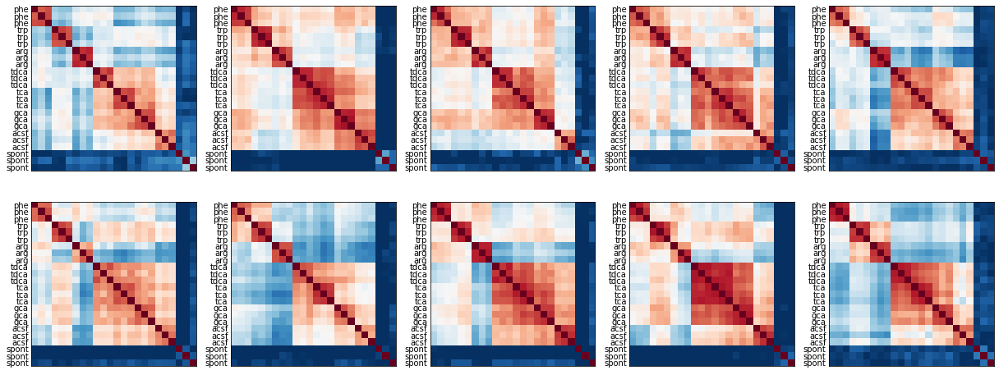

In [30]:
csplus = 'phe'
region = 'OB'
fig = plot_explist_pattern_corr(csplus, region, odor_list, frame_rate, time_window=[6,11])

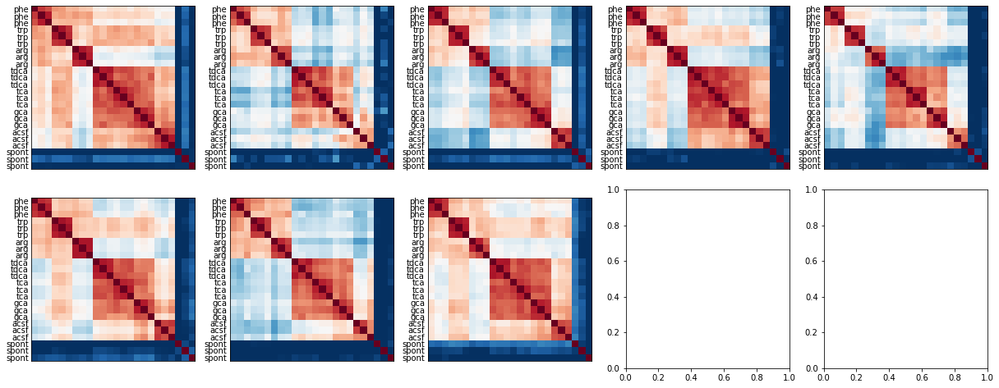

In [31]:
csplus = 'arg'
region = 'OB'
fig = plot_explist_pattern_corr(csplus, region, odor_list, frame_rate, time_window=[6,11])

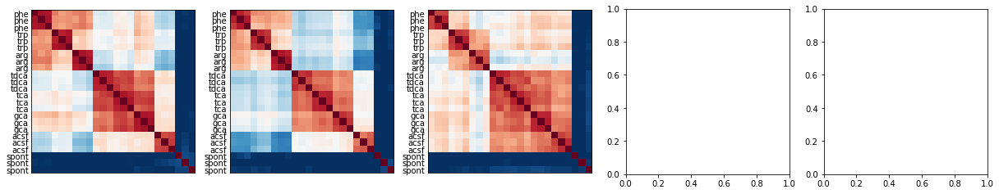

In [32]:
csplus = 'naive'
region = 'OB'
fig = plot_explist_pattern_corr(csplus, region, odor_list, frame_rate, time_window=[6,11])

In [33]:
importlib.reload(ptt)
compute_pattern_explist = ecl.get_data_dict_decorator(exp_list, region_list, dfovf_dict, ptt.bin_and_restack)

In [34]:
tbin = 5
pattern_dict = compute_pattern_explist(tbin)

2021-02-05-DpOBEM-JH9 Dp
2021-03-18-DpOBEM-JH10 Dp
2021-03-19-DpOBEM-JH10 Dp
2021-04-02-DpOBEM-JH11 Dp
2021-04-03-DpOBEM-JH11 Dp
2021-05-01-DpOBEM-JH13 Dp
2021-05-22-DpOBEM-JH14 Dp
2021-07-15-DpOBEM-N2 Dp
2021-07-16-DpOBEM-N3 Dp
2021-07-30-DpOBEM-JH17 Dp
2021-07-31-DpOBEM-JH17 Dp
2021-09-02-DpOBEM-JH18 Dp
2021-09-03-DpOBEM-JH18 Dp
2021-09-04-DpOBEM-JH18 Dp
2021-09-15-DpOBEM-JH20 Dp
2021-09-17-DpOBEM-JH20 Dp
2021-09-18-DpOBEM-JH20 Dp
2021-09-29-DpOBEM-JH21 Dp
2021-10-01-DpOBEM-JH21 Dp
2021-10-02-DpOBEM-JH21 Dp
2021-11-10-DpOBEM-JH23 Dp
2021-11-14-DpOBEM-JH23 Dp
2021-11-24-DpOBEM-JH24 Dp
2021-11-27-DpOBEM-JH24 Dp
2021-11-26-DpOBEM-JH24 Dp
2021-12-10-DpOBEM-N4 Dp
2021-02-05-DpOBEM-JH9 OB
2021-03-18-DpOBEM-JH10 OB
2021-03-19-DpOBEM-JH10 OB
2021-04-02-DpOBEM-JH11 OB
2021-04-03-DpOBEM-JH11 OB
2021-05-01-DpOBEM-JH13 OB
2021-05-22-DpOBEM-JH14 OB
2021-07-15-DpOBEM-N2 OB
2021-07-16-DpOBEM-N3 OB
2021-07-30-DpOBEM-JH17 OB
2021-07-31-DpOBEM-JH17 OB
2021-09-02-DpOBEM-JH18 OB
2021-09-03-DpOBEM-JH18 O

In [35]:
importlib.reload(emb)
standardize_explist = ecl.get_data_dict_decorator(exp_list, region_list, pattern_dict, emb.quantile_all)
std_pattern_dict = standardize_explist(q=1)

2021-02-05-DpOBEM-JH9 Dp
2021-03-18-DpOBEM-JH10 Dp
2021-03-19-DpOBEM-JH10 Dp
2021-04-02-DpOBEM-JH11 Dp
2021-04-03-DpOBEM-JH11 Dp
2021-05-01-DpOBEM-JH13 Dp
2021-05-22-DpOBEM-JH14 Dp
2021-07-15-DpOBEM-N2 Dp


/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site

2021-07-16-DpOBEM-N3 Dp
2021-07-30-DpOBEM-JH17 Dp
2021-07-31-DpOBEM-JH17 Dp
2021-09-02-DpOBEM-JH18 Dp
2021-09-03-DpOBEM-JH18 Dp
2021-09-04-DpOBEM-JH18 Dp
2021-09-15-DpOBEM-JH20 Dp
2021-09-17-DpOBEM-JH20 Dp


/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site

2021-09-18-DpOBEM-JH20 Dp
2021-09-29-DpOBEM-JH21 Dp
2021-10-01-DpOBEM-JH21 Dp
2021-10-02-DpOBEM-JH21 Dp
2021-11-10-DpOBEM-JH23 Dp
2021-11-14-DpOBEM-JH23 Dp
2021-11-24-DpOBEM-JH24 Dp


/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site

2021-11-27-DpOBEM-JH24 Dp
2021-11-26-DpOBEM-JH24 Dp
2021-12-10-DpOBEM-N4 Dp
2021-02-05-DpOBEM-JH9 OB
2021-03-18-DpOBEM-JH10 OB
2021-03-19-DpOBEM-JH10 OB


/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site

2021-04-02-DpOBEM-JH11 OB
2021-04-03-DpOBEM-JH11 OB
2021-05-01-DpOBEM-JH13 OB
2021-05-22-DpOBEM-JH14 OB
2021-07-15-DpOBEM-N2 OB
2021-07-16-DpOBEM-N3 OB


/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site

2021-07-30-DpOBEM-JH17 OB
2021-07-31-DpOBEM-JH17 OB
2021-09-02-DpOBEM-JH18 OB
2021-09-03-DpOBEM-JH18 OB
2021-09-04-DpOBEM-JH18 OB
2021-09-15-DpOBEM-JH20 OB
2021-09-17-DpOBEM-JH20 OB


/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site

2021-09-18-DpOBEM-JH20 OB
2021-09-29-DpOBEM-JH21 OB
2021-10-01-DpOBEM-JH21 OB
2021-10-02-DpOBEM-JH21 OB
2021-11-10-DpOBEM-JH23 OB
2021-11-14-DpOBEM-JH23 OB


/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site

2021-11-24-DpOBEM-JH24 OB
2021-11-27-DpOBEM-JH24 OB
2021-11-26-DpOBEM-JH24 OB
2021-12-10-DpOBEM-N4 OB


/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


In [36]:
# region = 'OB'
region = 'Dp'
plist = [p.transpose() for p in std_pattern_dict[region].values()]
all_pattern = pd.concat(plist, keys=std_pattern_dict[region].keys(), names=['fish_id'])
list(all_pattern.columns)

[('phe', 0, 0),
 ('phe', 0, 1),
 ('phe', 0, 2),
 ('phe', 0, 3),
 ('phe', 0, 4),
 ('phe', 0, 5),
 ('phe', 0, 6),
 ('phe', 0, 7),
 ('phe', 0, 8),
 ('phe', 0, 9),
 ('phe', 0, 10),
 ('phe', 0, 11),
 ('phe', 0, 12),
 ('phe', 0, 13),
 ('phe', 0, 14),
 ('phe', 0, 15),
 ('phe', 0, 16),
 ('phe', 0, 17),
 ('phe', 0, 18),
 ('phe', 0, 19),
 ('phe', 0, 20),
 ('phe', 0, 21),
 ('phe', 0, 22),
 ('phe', 0, 23),
 ('phe', 0, 24),
 ('phe', 0, 25),
 ('phe', 0, 26),
 ('phe', 0, 27),
 ('phe', 0, 28),
 ('phe', 0, 29),
 ('phe', 0, 30),
 ('phe', 0, 31),
 ('phe', 0, 32),
 ('phe', 1, 0),
 ('phe', 1, 1),
 ('phe', 1, 2),
 ('phe', 1, 3),
 ('phe', 1, 4),
 ('phe', 1, 5),
 ('phe', 1, 6),
 ('phe', 1, 7),
 ('phe', 1, 8),
 ('phe', 1, 9),
 ('phe', 1, 10),
 ('phe', 1, 11),
 ('phe', 1, 12),
 ('phe', 1, 13),
 ('phe', 1, 14),
 ('phe', 1, 15),
 ('phe', 1, 16),
 ('phe', 1, 17),
 ('phe', 1, 18),
 ('phe', 1, 19),
 ('phe', 1, 20),
 ('phe', 1, 21),
 ('phe', 1, 22),
 ('phe', 1, 23),
 ('phe', 1, 24),
 ('phe', 1, 25),
 ('phe', 1, 26),


In [37]:
all_pattern.to_pickle('../../results/JH_analysis/all_pattern_{}.pkl'.format(region))

In [4]:
all_pattern = pd.read_pickle('../../results/JH_analysis/all_pattern.pkl'.format(region))

In [38]:
from sklearn.decomposition import NMF
model = NMF(n_components=50, init='random', random_state=0)
X = all_pattern.transpose()
X = X-X.min(axis=0)
W = model.fit_transform(X)
H = model.components_

/home/hubo/.local/lib/python3.8/site-packages/sklearn/utils/validation.py:1675: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/home/hubo/.local/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


In [8]:
H

array([[5.69742837e-02, 5.14911635e-02, 1.91491726e-01, ...,
        3.57534555e-02, 2.09337053e-02, 2.00328323e-03],
       [0.00000000e+00, 1.34238159e-02, 0.00000000e+00, ...,
        3.04681969e-05, 1.35733033e-02, 3.03458500e-02],
       [1.54793476e-01, 1.70366622e-01, 3.93776628e-01, ...,
        2.35604055e-02, 8.49289524e-03, 0.00000000e+00],
       ...,
       [1.03185415e-02, 6.74790422e-02, 9.26225819e-02, ...,
        2.40377947e-02, 2.20853553e-02, 1.50676914e-01],
       [2.49983782e-02, 7.77889144e-02, 1.61991722e-01, ...,
        0.00000000e+00, 4.32909399e-02, 3.07980541e-02],
       [5.95834441e-02, 2.26640975e-02, 1.28902402e-02, ...,
        2.10267468e-02, 1.51873776e-02, 2.33428096e-02]])

In [18]:
print(X.shape)
print(H.shape)

(792, 47741)
(50, 47741)


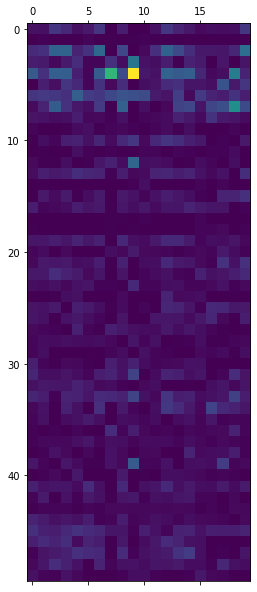

In [19]:
plt.matshow(H[:,:20], aspect='auto')

In [39]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=15, random_state=0).fit(H.transpose())

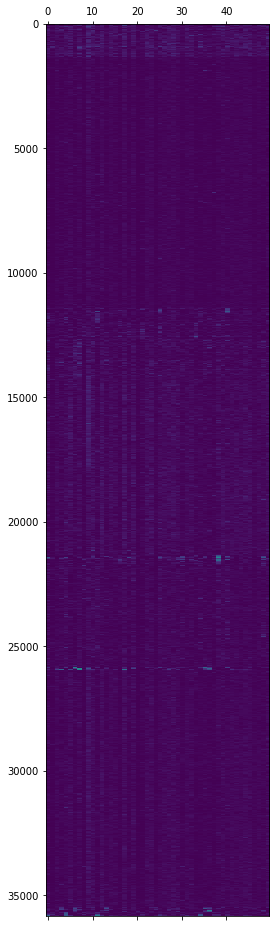

In [41]:
idx = np.argsort(kmeans.labels_)
plt.matshow(H.transpose()[idx,:], aspect='auto')

(array([11431.,   203.,  1048.,  1591.,  3556.,  3877.,  4139.,   148.,
         9476.,   381.]),
 array([ 0. ,  1.4,  2.8,  4.2,  5.6,  7. ,  8.4,  9.8, 11.2, 12.6, 14. ]),
 <BarContainer object of 10 artists>)

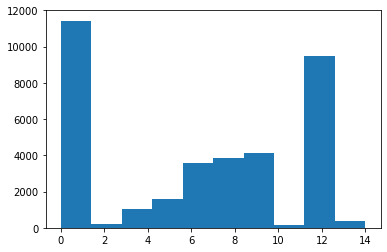

In [42]:
plt.hist(kmeans.labels_)

In [39]:
X

fish_id          2021-02-05-DpOBEM-JH9                                \
plane                                0                                 
neuron                             0         1         2         3     
odor  trial time                                                       
phe   0     0                 0.050553  0.069060  0.053942  0.027126   
            1                 0.064093  0.052118  0.071879  0.066053   
            2                 0.054571  0.063509  0.020057  0.054457   
            3                 0.054424  0.050089  0.040232  0.058729   
            4                 0.037582  0.052697  0.050815  0.040041   
...                                ...       ...       ...       ...   
spont 2     28                0.045120  0.081149  0.061539  0.054602   
            29                0.047601  0.050027  0.068521  0.069036   
            30                0.048510  0.048022  0.035668  0.046175   
            31                0.062164  0.064984  0.044095  0.054693   
            32                0.056783  0.040801  0.050910  0.039586   

fish_id                                                                       \
plane                                                                          
neuron                 4         5         6         7         8         9     
odor  trial time                                                               
phe   0     0     0.079651  0.062818  0.087697  0.082262  0.065060  0.051914   
            1     0.111641  0.058239  0.053393  0.048167  0.057470  0.033520   
            2     0.039321  0.092297  0.044557  0.034812  0.048538  0.050591   
            3     0.124133  0.075520  0.037001  0.042973  0.065126  0.049630   
            4     0.074386  0.041290  0.046173  0.049277  0.074221  0.069519   
...                    ...       ...       ...       ...       ...       ...   
spont 2     28    0.104890  0.048447  0.046710  0.056627  0.054829  0.060557   
            29    0.123195  0.046262  0.054404  0.064219  0.074944  0.071113   
            30    0.063862  0.071608  0.052901  0.081874  0.054827  0.068153   
            31    0.092093  0.051285  0.026629  0.085240  0.077598  0.082793   
            32    0.093989  0.067643  0.049241  0.084705  0.093504  0.082525   

fish_id           ... 2021-12-10-DpOBEM-N4                                \
plane             ...                    3                                 
neuron            ...                  210       211       212       213   
odor  trial time  ...                                                      
phe   0     0     ...             0.058391  0.033825  0.019189  0.066325   
            1     ...             0.050672  0.042059  0.018351  0.093849   
            2     ...             0.052466  0.022633  0.020420  0.036497   
            3     ...             0.040282  0.021205  0.019868  0.061278   
            4     ...             0.073916  0.043374  0.035438  0.055830   
...               ...                  ...       ...       ...       ...   
spont 2     28    ...             0.053116  0.045220  0.027025  0.075302   
            29    ...             0.075153  0.051526  0.019905  0.066243   
            30    ...             0.066723  0.042808  0.023923  0.053850   
            31    ...             0.072839  0.022318  0.037860  0.080644   
            32    ...             0.107319  0.051838  0.027345  0.059271   

fish_id                                                                       
plane                                                                         
neuron                 214       215       216       217       218       219  
odor  trial time                                                              
phe   0     0     0.057077  0.055250  0.023901  0.074543  0.035293  0.052601  
            1     0.086721  0.055108  0.030337  0.064521  0.012782  0.055731  
            2     0.061435  0.050368  0.049437  0.060770  0.038437  0.051092  
            3     0.0456

In [43]:
Xc = X.append(pd.DataFrame(kmeans.labels_.reshape(1,-1), columns=X.columns))

In [44]:
Xcs = Xc.sort_values(0, axis=1)

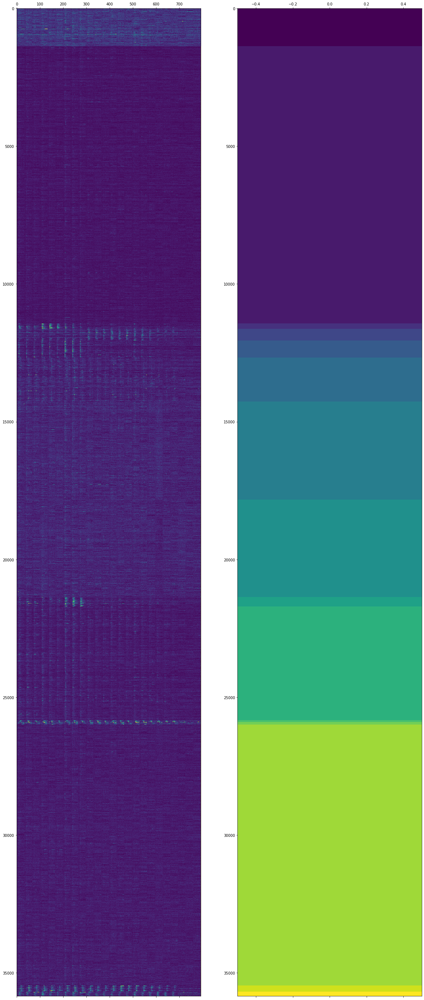

In [48]:
fig, ax = plt.subplots(1,2,figsize=(20,50))
im = ax[0].matshow(Xcs.transpose(), aspect='auto')
im.set_clim(vmin = 0, vmax = 0.7)
imc = ax[1].matshow(Xcs.loc[[0]].transpose(), aspect='auto')

In [54]:
pd.DataFrame(kmeans.labels_.reshape(1,-1), columns=X.columns)

fish_id 2021-02-05-DpOBEM-JH9                                      ...  \
plane                       0                                      ...   
neuron                    0   1   2   3   4   5   6   7   8   9    ...   
0                          10  10  10  10   3   4  10   5  11   5  ...   

fish_id 2021-12-10-DpOBEM-N4                                      
plane                      3                                      
neuron                   210 211 212 213 214 215 216 217 218 219  
0                          7   1   2   8   7   7   8   1   8   2  

[1 rows x 47741 columns]

In [34]:
def plot_nrn_in_cluster(kmeans, cluster_idx, ax=None):
    if ax is None:
        fig, ax = plt.subplots()
    nrn_idx = np.where(kmeans.labels_==cluster_idx)
    im = ax.matshow(X.iloc[:,nrn_idx[0]].transpose(),aspect='auto')
    im.set_clim(vmin = 0, vmax = 0.7)

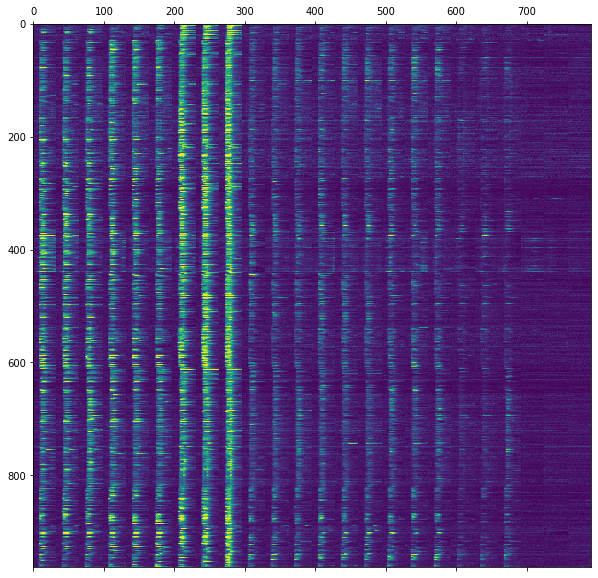

In [35]:
fig, ax = plt.subplots(figsize=(10,10))
plot_nrn_in_cluster(kmeans, cluster_idx=0, ax=ax)

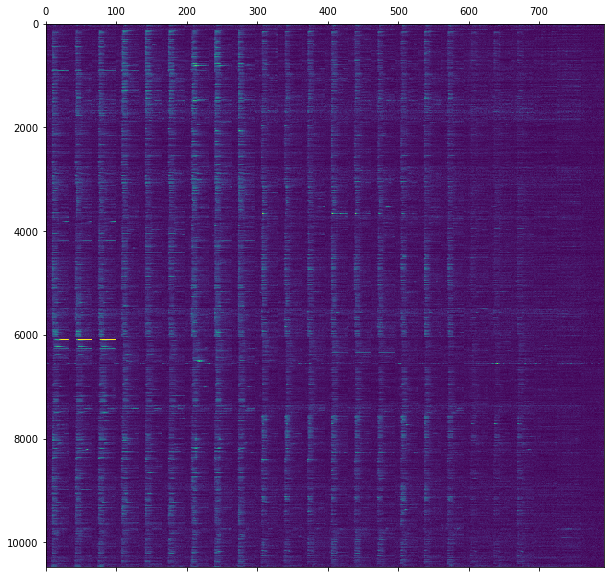

In [36]:
fig, ax = plt.subplots(figsize=(10,10))
plot_nrn_in_cluster(kmeans, cluster_idx=1, ax=ax)

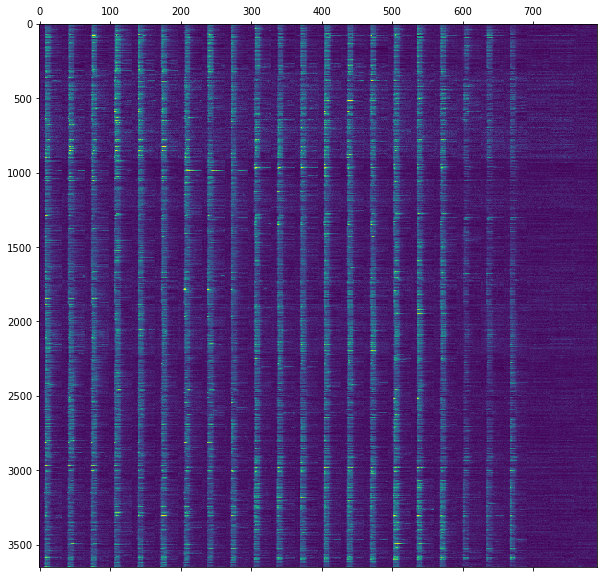

In [37]:
fig, ax = plt.subplots(figsize=(10,10))
plot_nrn_in_cluster(kmeans, cluster_idx=2, ax=ax)

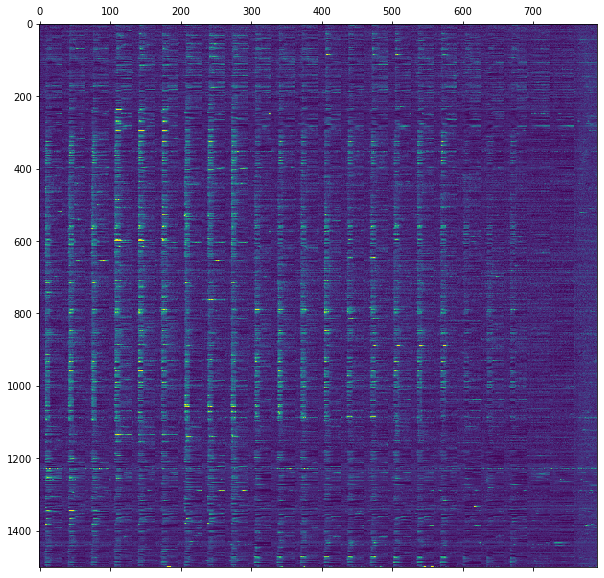

In [38]:
fig, ax = plt.subplots(figsize=(10,10))
plot_nrn_in_cluster(kmeans, cluster_idx=3, ax=ax)

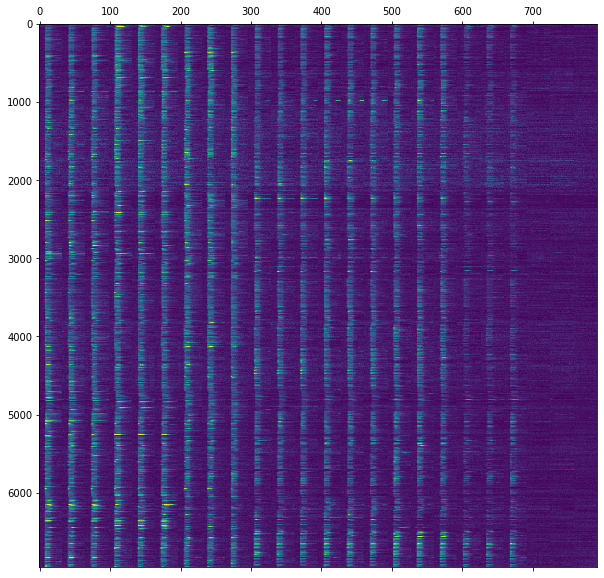

In [108]:
fig, ax = plt.subplots(figsize=(10,10))
plot_nrn_in_cluster(kmeans, cluster_idx=4, ax=ax)

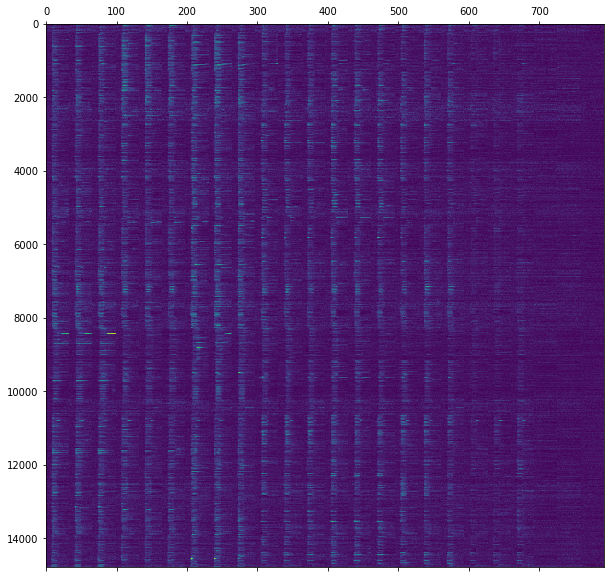

In [109]:
fig, ax = plt.subplots(figsize=(10,10))
plot_nrn_in_cluster(kmeans, cluster_idx=5, ax=ax)

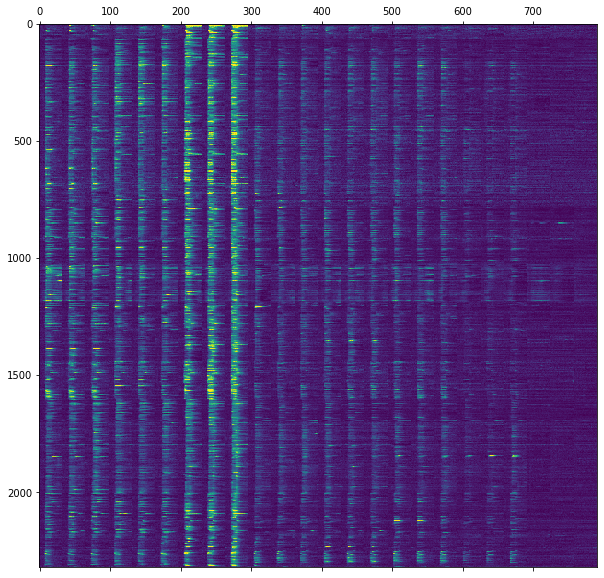

In [110]:
fig, ax = plt.subplots(figsize=(10,10))
plot_nrn_in_cluster(kmeans, cluster_idx=6, ax=ax)

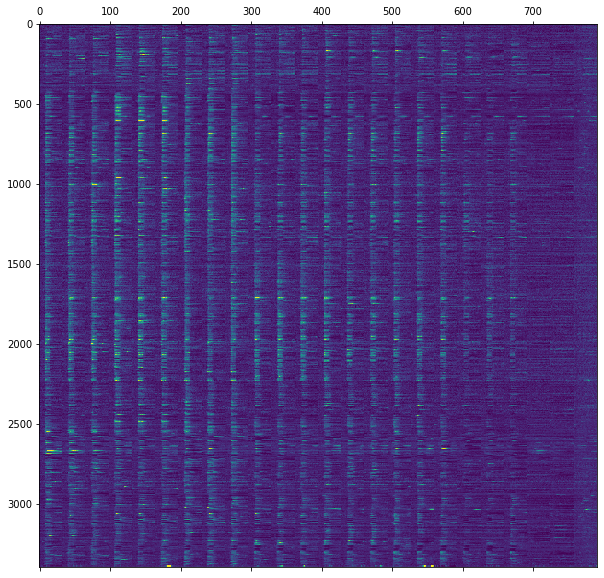

In [111]:
fig, ax = plt.subplots(figsize=(10,10))
plot_nrn_in_cluster(kmeans, cluster_idx=7, ax=ax)

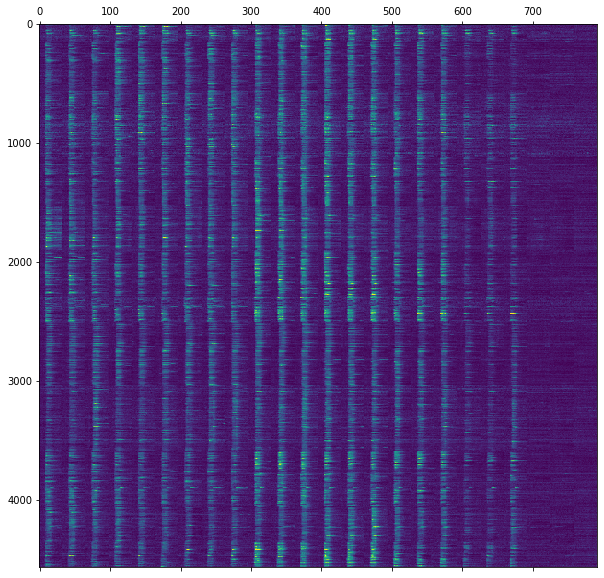

In [112]:
fig, ax = plt.subplots(figsize=(10,10))
plot_nrn_in_cluster(kmeans, cluster_idx=9, ax=ax)

In [87]:
def plot_avg_in_cluster(kmeans, cluster_idx, ax=None):
    if ax is None:
        fig, ax = plt.subplots()
    nrn_idx = np.where(kmeans.labels_==cluster_idx)
    ax.plot(X.iloc[:,nrn_idx[0]].transpose().min(axis=0).to_numpy())

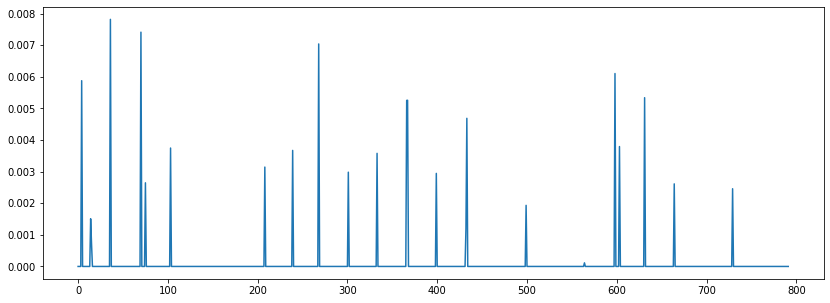

In [88]:
fig, ax = plt.subplots(figsize=(14,5))
plot_avg_in_cluster(kmeans, cluster_idx=0, ax=ax)

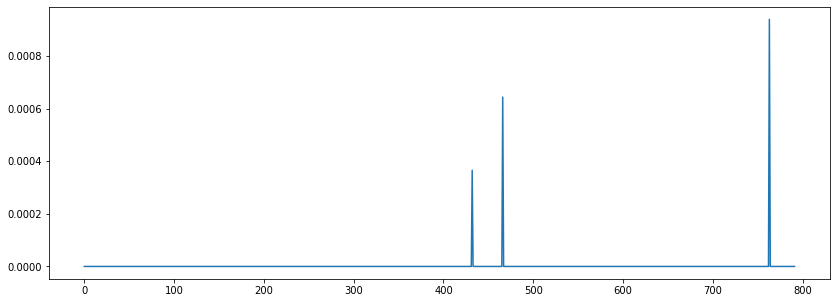

In [89]:
fig, ax = plt.subplots(figsize=(14,5))
plot_avg_in_cluster(kmeans, cluster_idx=1, ax=ax)

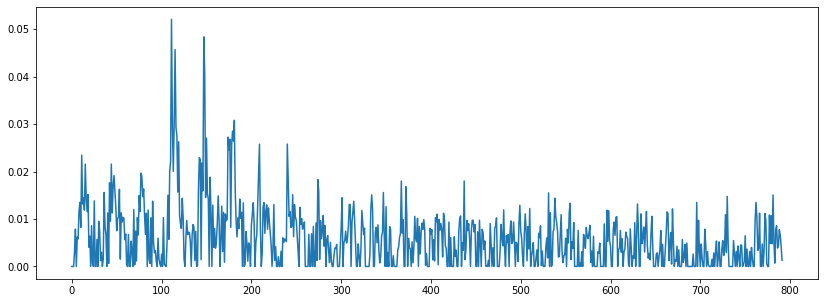

In [90]:
fig, ax = plt.subplots(figsize=(14,5))
plot_avg_in_cluster(kmeans, cluster_idx=2, ax=ax)

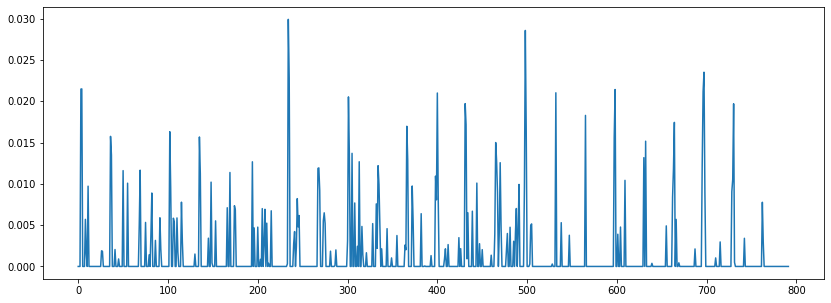

In [91]:
fig, ax = plt.subplots(figsize=(14,5))
plot_avg_in_cluster(kmeans, cluster_idx=3, ax=ax)

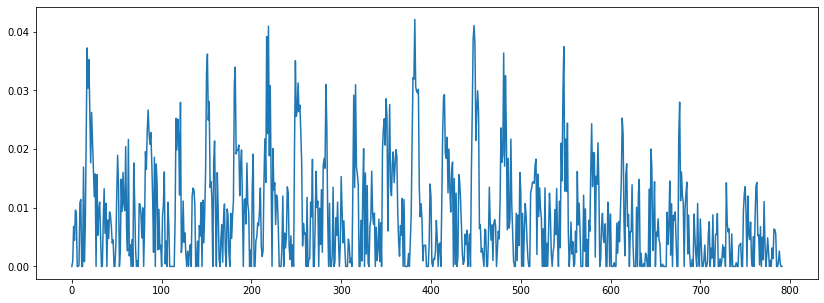

In [92]:
fig, ax = plt.subplots(figsize=(14,5))
plot_avg_in_cluster(kmeans, cluster_idx=4, ax=ax)

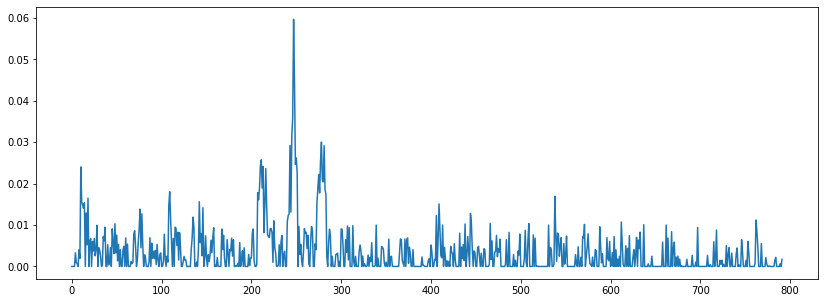

In [93]:
fig, ax = plt.subplots(figsize=(14,5))
plot_avg_in_cluster(kmeans, cluster_idx=5, ax=ax)

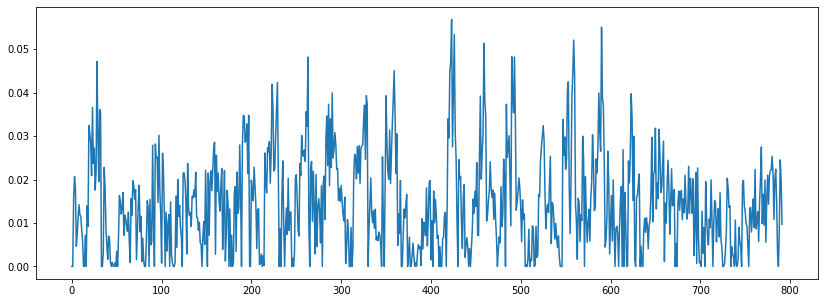

In [94]:
fig, ax = plt.subplots(figsize=(14,5))
plot_avg_in_cluster(kmeans, cluster_idx=6, ax=ax)

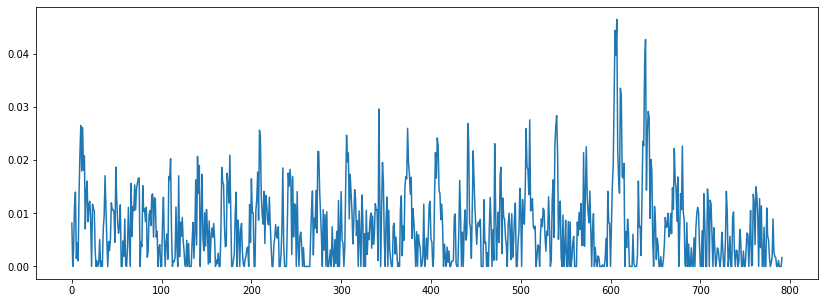

In [95]:
fig, ax = plt.subplots(figsize=(14,5))
plot_avg_in_cluster(kmeans, cluster_idx=7, ax=ax)

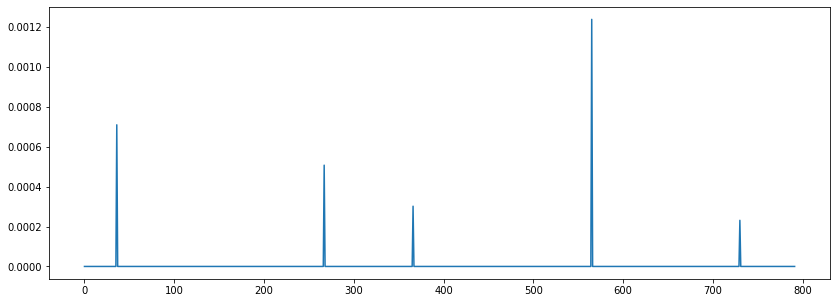

In [97]:
fig, ax = plt.subplots(figsize=(14,5))
plot_avg_in_cluster(kmeans, cluster_idx=9, ax=ax)

In [51]:
H.argmax(axis=0)

array([4, 7, 7, ..., 3, 3, 5])

In [15]:
compute_pca_explist = ecl.get_data_dict_decorator(exp_list, region_list, std_pattern_dict, emb.compute_pca)
n_components = 200
pca_dict = compute_pca_explist(n_components) 

2021-02-05-DpOBEM-JH9 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-03-18-DpOBEM-JH10 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-03-19-DpOBEM-JH10 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-04-02-DpOBEM-JH11 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-04-03-DpOBEM-JH11 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-05-01-DpOBEM-JH13 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-05-22-DpOBEM-JH14 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-15-DpOBEM-N2 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-16-DpOBEM-N3 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-30-DpOBEM-JH17 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-31-DpOBEM-JH17 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-02-DpOBEM-JH18 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-03-DpOBEM-JH18 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-04-DpOBEM-JH18 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-15-DpOBEM-JH20 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-17-DpOBEM-JH20 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-18-DpOBEM-JH20 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-29-DpOBEM-JH21 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-10-01-DpOBEM-JH21 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-10-02-DpOBEM-JH21 Dp


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-02-05-DpOBEM-JH9 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-03-18-DpOBEM-JH10 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-03-19-DpOBEM-JH10 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-04-02-DpOBEM-JH11 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-04-03-DpOBEM-JH11 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-05-01-DpOBEM-JH13 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-05-22-DpOBEM-JH14 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-15-DpOBEM-N2 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-16-DpOBEM-N3 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-30-DpOBEM-JH17 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-07-31-DpOBEM-JH17 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-02-DpOBEM-JH18 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-03-DpOBEM-JH18 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-04-DpOBEM-JH18 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-15-DpOBEM-JH20 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-17-DpOBEM-JH20 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-18-DpOBEM-JH20 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-09-29-DpOBEM-JH21 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-10-01-DpOBEM-JH21 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


2021-10-02-DpOBEM-JH21 OB


/home/hubo/python_env/catrace/lib/python3.8/site-packages/sklearn/utils/validation.py:1673: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(


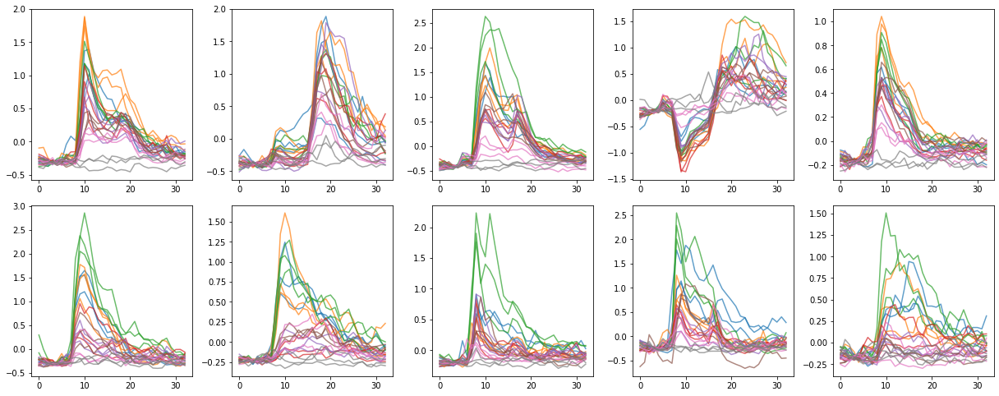

In [16]:
plot_explist_pca_1d = ecl.plot_explist_decorator(emb.plot_embed_1d, csplus_dict, pca_dict)
csplus = 'phe'
region = 'Dp'
fig = plot_explist_pca_1d(csplus, region, 0)

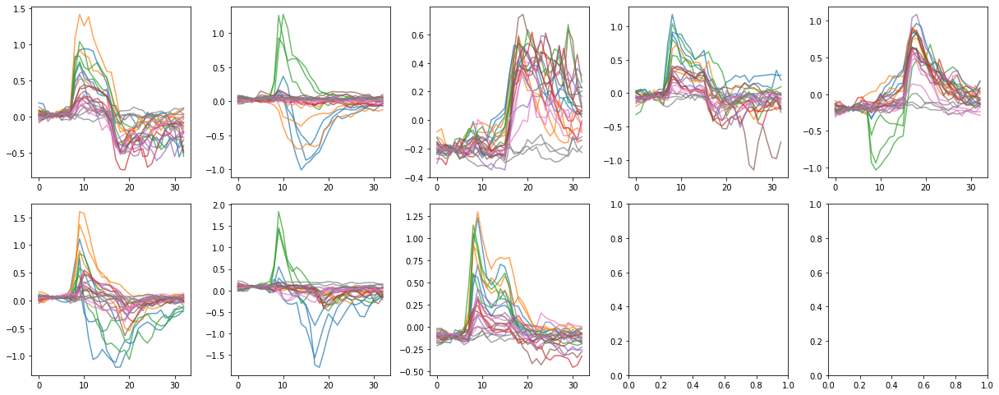

In [17]:
csplus = 'arg'
region = 'Dp'
fig = plot_explist_pca_1d(csplus, region, 1)

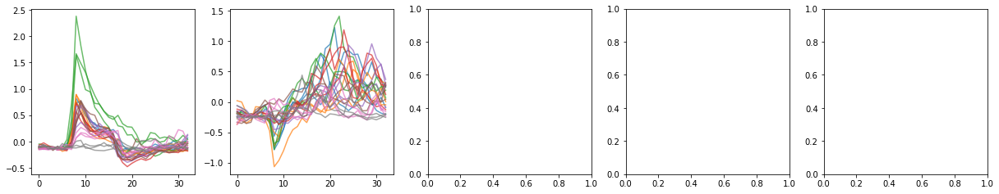

In [18]:
csplus = 'naive'
region = 'Dp'
fig = plot_explist_pca_1d(csplus, region, 1)

In [19]:
import sys
sys.path.insert(0, '/home/hubo/Projects/Ca_imaging/scripts/cca/pyrcca')
import rcca
rcca.__file__

'/home/hubo/Projects/Ca_imaging/scripts/cca/pyrcca/rcca/__init__.py'

In [20]:
importlib.reload(rcca)
# Create a cca object as an instantiation of the CCA object class. 
nComponents = 10
cca = rcca.CCA(kernelcca = False, reg = 0., numCC = nComponents)
region = 'Dp'
csplus = 'phe'
csexp_list = csplus_dict[csplus].copy()
csplus = 'arg'
csexp_list.extend(csplus_dict[csplus])
csplus = 'naive'
csexp_list.extend(csplus_dict[csplus])
print(csexp_list)
data_list = [pca_dict[region][exp]['latent'] for exp in csexp_list]
cca.train(data_list)

['2021-02-05-DpOBEM-JH9', '2021-03-18-DpOBEM-JH10', '2021-03-19-DpOBEM-JH10', '2021-04-02-DpOBEM-JH11', '2021-04-03-DpOBEM-JH11', '2021-05-01-DpOBEM-JH13', '2021-05-22-DpOBEM-JH14', '2021-09-15-DpOBEM-JH20', '2021-09-17-DpOBEM-JH20', '2021-09-18-DpOBEM-JH20', '2021-07-30-DpOBEM-JH17', '2021-07-31-DpOBEM-JH17', '2021-09-02-DpOBEM-JH18', '2021-09-03-DpOBEM-JH18', '2021-09-04-DpOBEM-JH18', '2021-09-29-DpOBEM-JH21', '2021-10-01-DpOBEM-JH21', '2021-10-02-DpOBEM-JH21', '2021-07-15-DpOBEM-N2', '2021-07-16-DpOBEM-N3']
Training CCA, kernel = None, regularization = 0.0000, 10 components


['phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'phe', 'arg', 'arg', 'arg', 'arg', 'arg', 'arg', 'arg', 'arg', 'naive', 'naive']


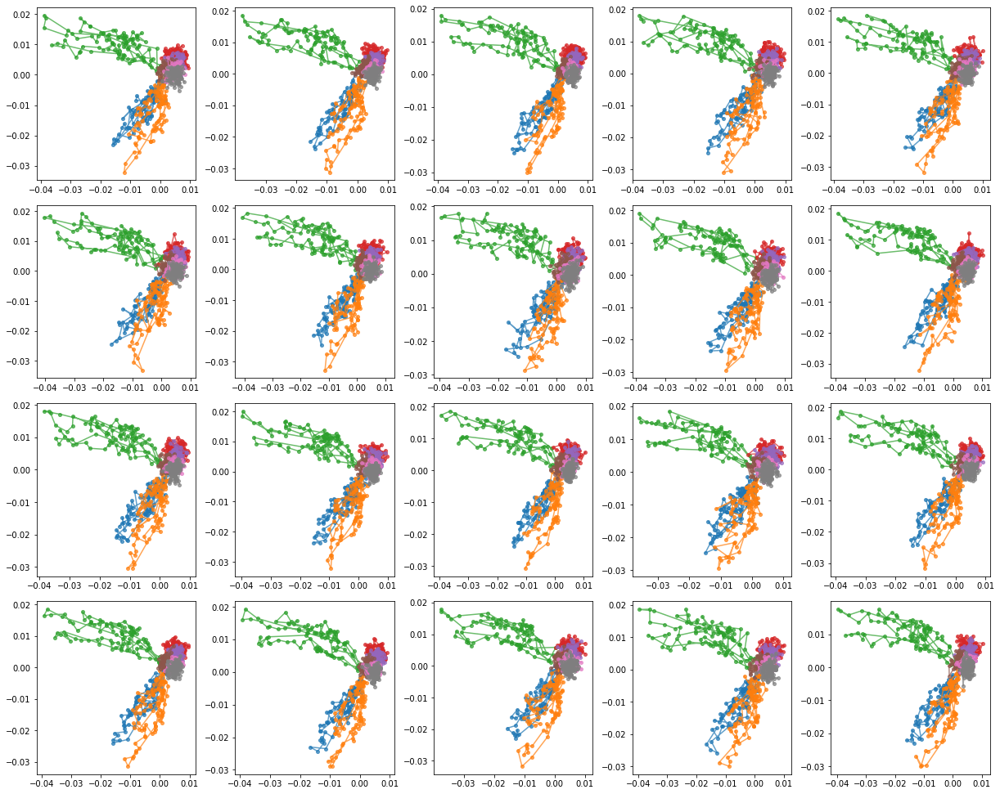

In [21]:
xx_dict = dict(exp_list)
xx_list = [xx_dict[exp] for exp in csexp_list]
print(xx_list)
plot_func = emb.plot_embed_2d
ccacomp_list = [dict(latent=comps, index=pca_dict[region][exp_list[idx][0]]['index']) for idx,comps in enumerate(cca.comps)]
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=(0,1))

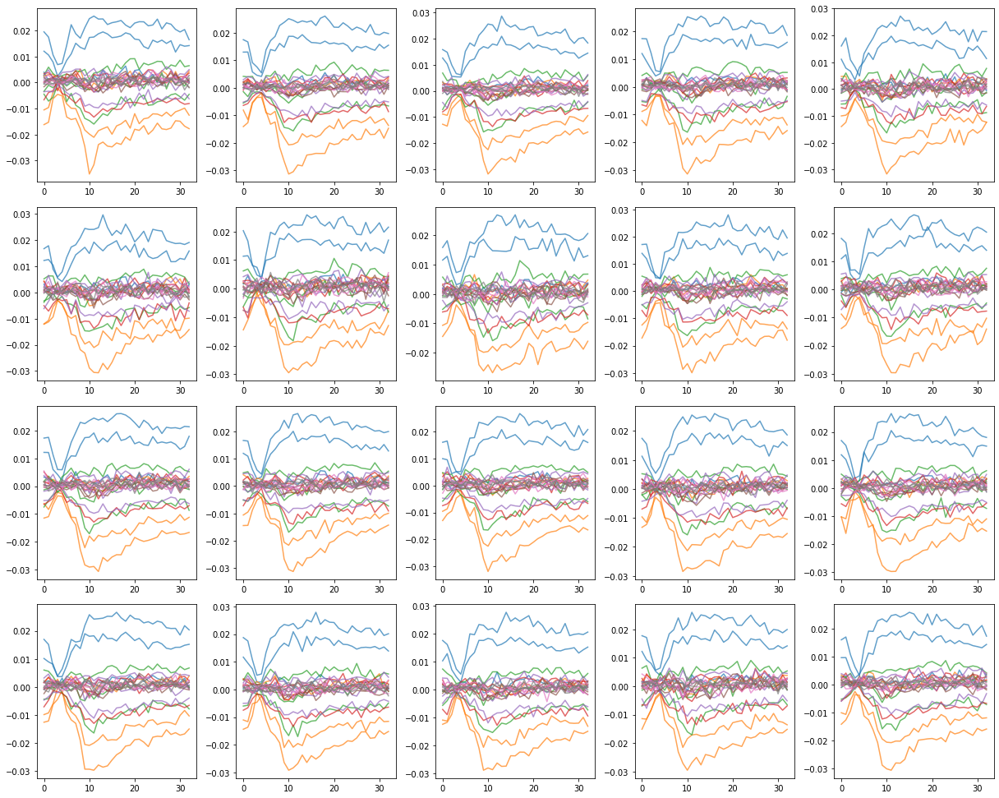

In [22]:
plot_func = emb.plot_embed_1d
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=2) 

In [23]:
pca_dict

{'Dp': {'2021-02-05-DpOBEM-JH9': {'latent': array([[-0.22590912, -0.18743664, -0.02306677, ..., -0.00855279,
            0.022874  ,  0.02778731],
          [-0.26952227, -0.25585495, -0.05985045, ...,  0.02289654,
            0.03129897, -0.02807309],
          [-0.28226475, -0.25085644, -0.08460349, ...,  0.03521242,
            0.01286121,  0.06284628],
          ...,
          [-0.41037708, -0.05092728,  0.05719563, ...,  0.00816986,
            0.00583268,  0.07850467],
          [-0.37933441, -0.05865727,  0.06875356, ...,  0.01185696,
            0.03785191,  0.01531206],
          [-0.35901151, -0.11891595, -0.00379587, ...,  0.01403562,
           -0.03916527, -0.00663895]]),
   'index': MultiIndex([(  'phe', 0,  0),
               (  'phe', 0,  1),
               (  'phe', 0,  2),
               (  'phe', 0,  3),
               (  'phe', 0,  4),
               (  'phe', 0,  5),
               (  'phe', 0,  6),
               (  'phe', 0,  7),
               (  'phe', 0,  8),


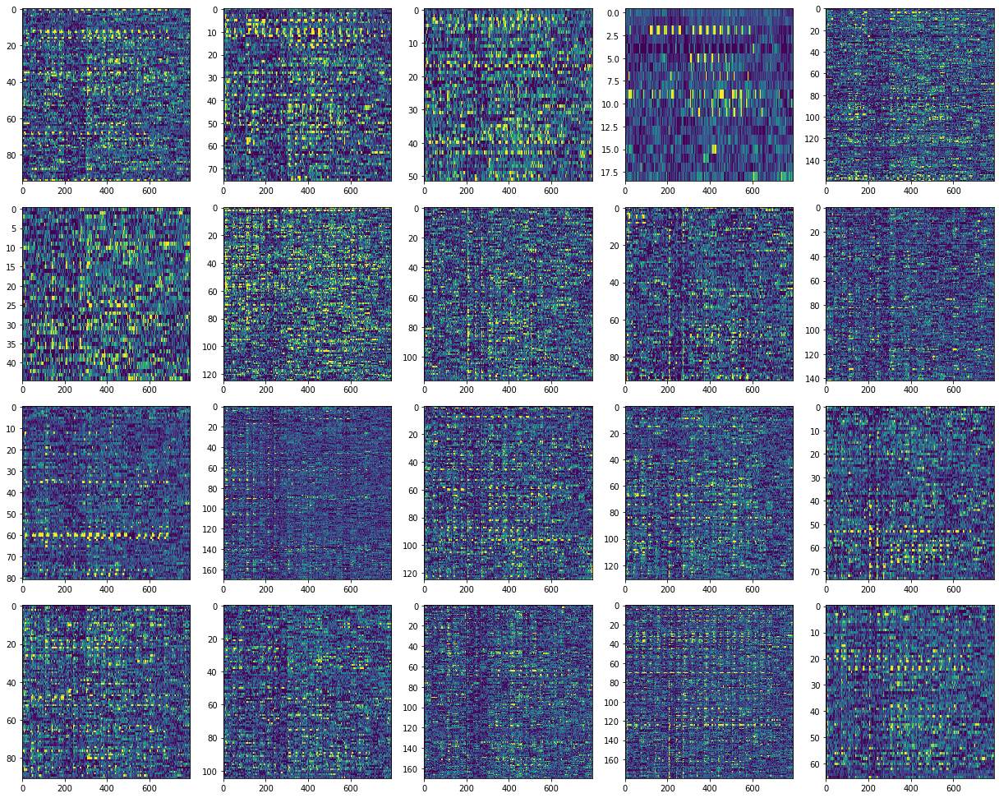

In [56]:
from catrace import cancorr
from catrace import visualize as vis

importlib.reload(cancorr)
importlib.reload(vis)
comp_kwargs = dict(comp_idx=0, thresh=0.002, criterion='above')
pca_list = pca_dict[region]
pattern_list = pattern_dict[region]
comp_pattern_list = cancorr.get_comp_pattern_list(csexp_list, pca_list, pattern_list, cca, comp_kwargs)


climit=[-0.1, 0.5]
fig = ecl.plot_explist(comp_pattern_list, vis.plot_pattern_heatmap, False, False, climit)

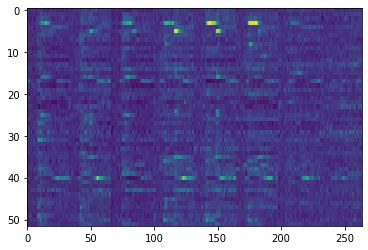

In [59]:
importlib.reload(vis)
pattern = comp_pattern_list[2]
pattern
pattern_avg_trial = pattern.unstack(level=['odor','time']).mean().unstack(level=['odor','time'])
vis.plot_pattern_heatmap(pattern_avg_trial.T)

[False False  True False False False False False  True False False False
 False False False False False False False False False False False False
 False False False  True False False False False False False False False
 False False False False False False False False False False False False
 False False False False  True False False False False False False False]


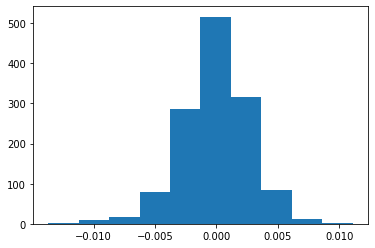

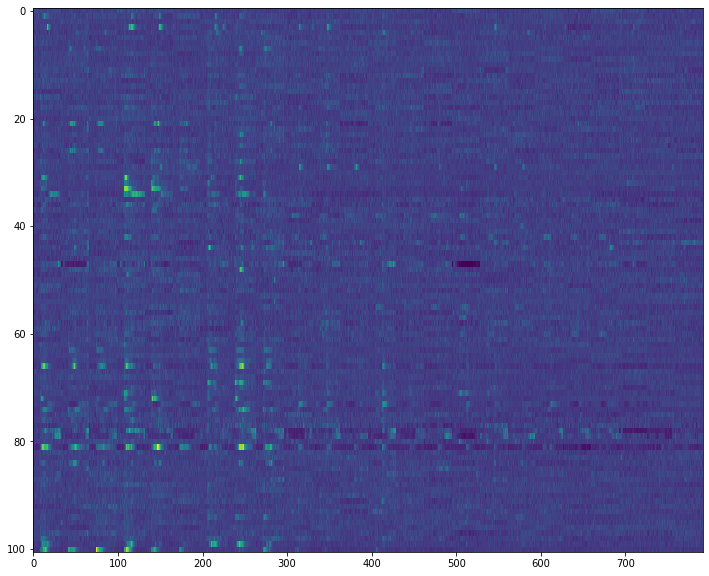

In [27]:
exp_idx = 2
region = 'Dp'
exp = csexp_list[exp_idx]
pca = pca_dict[region][exp]['pca']
pattern = std_pattern_dict[region][exp]

wmat = pca.components_

kmat = cca.ws[exp_idx]

qmat = np.dot(kmat.T,wmat)
plt.hist(qmat.T[:,0])

comp_idx = 1
thresh = 0.006
nrn_idx = np.abs(qmat[comp_idx,:]) >= thresh
print(nrn_idx[:60])
comp_pattern = pattern.loc[:,nrn_idx]
fig, ax = plt.subplots(figsize=(12,10))
ax.imshow(comp_pattern.T, aspect='auto', interpolation='none')

In [91]:
importlib.reload(rcca)
# Create a cca object as an instantiation of the CCA object class. 
nComponents = 10
cca = rcca.CCA(kernelcca = False, reg = 0., numCC = nComponents)
region = 'OB'
csplus = 'phe'
csexp_list = csplus_dict[csplus].copy()
csplus = 'arg'
csexp_list.extend(csplus_dict[csplus])
csplus = 'naive'
csexp_list.extend(csplus_dict[csplus])
print(csexp_list)
data_list = [pca_dict[exp][region]['latent'] for exp in csexp_list]
cca.train(data_list)

['2021-02-05-DpOBEM-JH9', '2021-03-18-DpOBEM-JH10', '2021-07-30-DpOBEM-JH17', '2021-07-31-DpOBEM-JH17', '2021-07-15-DpOBEM-N2', '2021-07-16-DpOBEM-N3']
Training CCA, kernel = None, regularization = 0.0000, 10 components


['phe', 'phe', 'arg', 'arg', 'naive', 'naive']


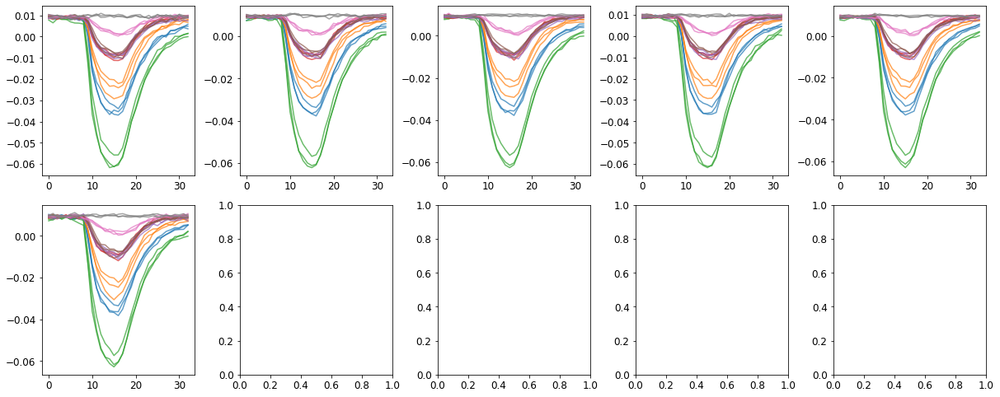

In [92]:
xx_dict = dict(exp_list)
xx_list = [xx_dict[exp] for exp in csexp_list]
print(xx_list)
plot_func = emb.plot_embed_1d
ccacomp_list = [dict(latent=comps, index=pca_dict[exp_list[idx][0]][region]['index']) for idx,comps in enumerate(cca.comps)]
fig = ecl.plot_explist(ccacomp_list, plot_func, False, False, component_idx=0)

[False False False False False False False False False False False False
  True  True False False False False False  True False  True False False
 False False False  True False False False False False False False False
 False  True False False False False False False False False False  True
 False False False False False False False False False  True False False]


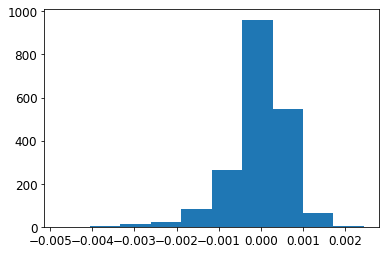

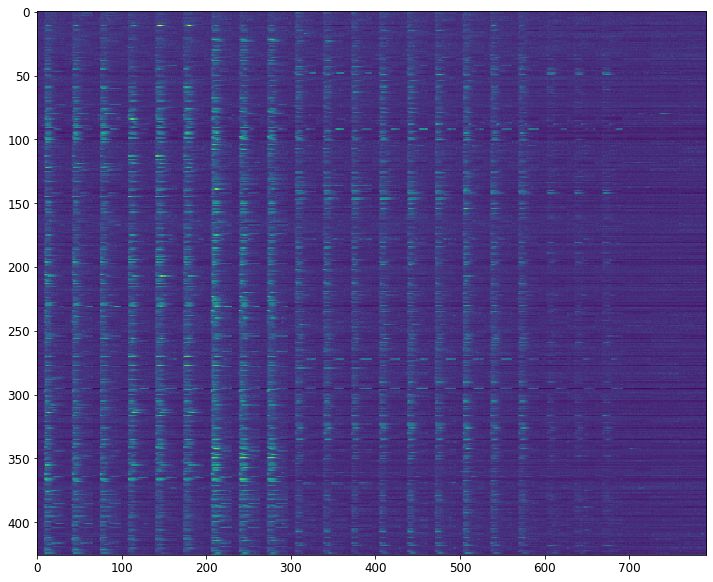

In [101]:
exp_idx = 5
exp = csexp_list[exp_idx]
pca = pca_dict[exp][region]['pca']
pattern = std_pattern_dict[exp][region]

wmat = pca.components_

kmat = cca.ws[exp_idx]

qmat = np.dot(kmat.T,wmat)
plt.hist(qmat.T[:,0])

comp_idx = 2
thresh = 0.001
nrn_idx = np.abs(qmat[comp_idx,:]) >= thresh
print(nrn_idx[:60])
comp_pattern = pattern.loc[:,nrn_idx]
fig, ax = plt.subplots(figsize=(12,10))
ax.imshow(comp_pattern.T, aspect='auto', interpolation='none')